In [7]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
%matplotlib inline
# use matplotlib to show opencv pic
def matshow(title='image',image=None,gray=False):
 if isinstance(image,np.ndarray):
     if len(image.shape) ==2:
         pass
     elif gray == True:
         # transfer color space to gray in opencv
         image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
     else:
         # transfer color space to RGB in opencv
         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
 plt.figure()
 plt.imshow(image,cmap='gray')

 plt.axis('off') # close axis
 plt.title(title) # title
 plt.show()

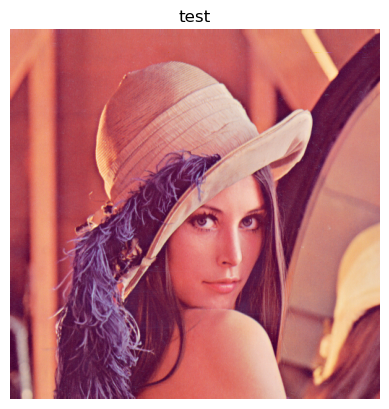

In [15]:
import cv2
# read one image
# the secend parameter show the way to read, 1 means read as a color image, 0 means gray
im = cv2.imread(r"lena.png",1)
matshow("test",im)

In [17]:
# Print the data structure type of the image data.
print(type(im))
# Size of the printed image.
print(im.shape)

<class 'numpy.ndarray'>
(512, 512, 3)


In [19]:
# Save the image to the specified path.
cv2.imwrite('lena.jpg', im)

True

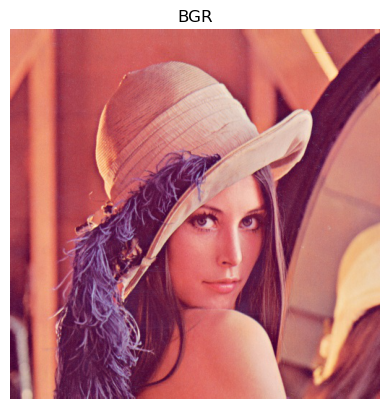

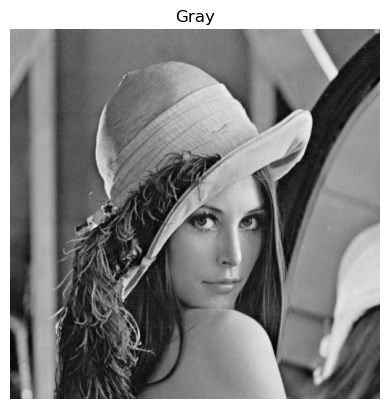

In [21]:
import cv2
im = cv2.imread(r"lena.jpg")
matshow("BGR", im)
# Use cvtColor to change the color space. cv2. COLOR_BGR2GRAY indicates BGR to gray.
img_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
matshow("Gray", img_gray)

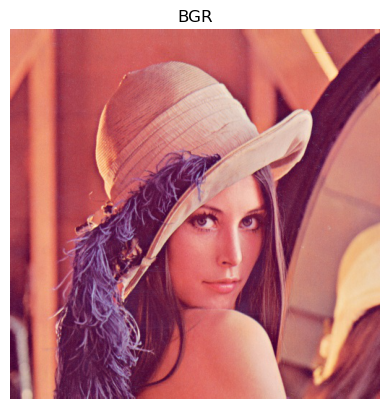

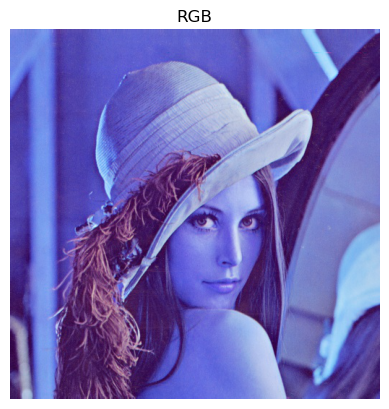

In [23]:
import cv2
im = cv2.imread(r"lena.jpg")
matshow("BGR", im)
# Use cvtColor to change the color space. cv2. COLOR_BGR2RGB indicates BGR to RGB
im_rgb = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
# When the image data is in three channels, the imshow function considers that the data is BGR.
# Run the imshow command to display RGB data. It is found that the image color is distorted.
matshow("RGB", im_rgb)

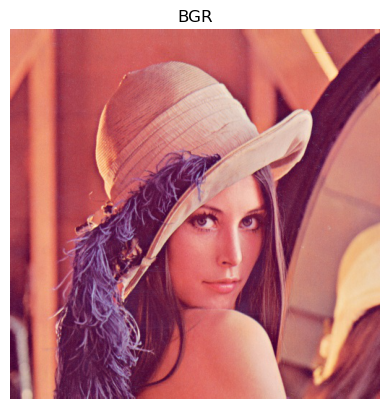

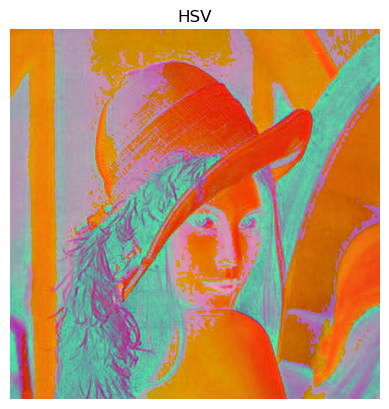

In [27]:
import cv2
im = cv2.imread(r"lena.jpg")
matshow("BGR", im)
# Use cvtColor to change the color space. cv2. COLOR_BGR2HSV indicates BGR to HSV.
im_hsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)
# When the image data is in three channels, the imshow function considers that the data is BGR.
# Run the imshow command to display HSV data. The HSV component is forcibly displayed as the BGR.
matshow("HSV", im_hsv)

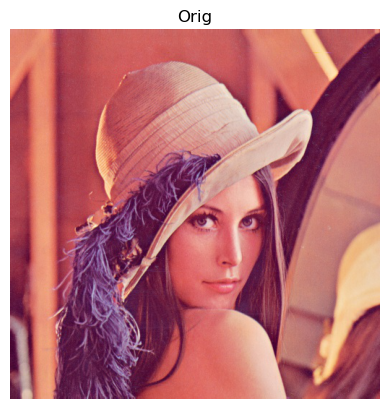

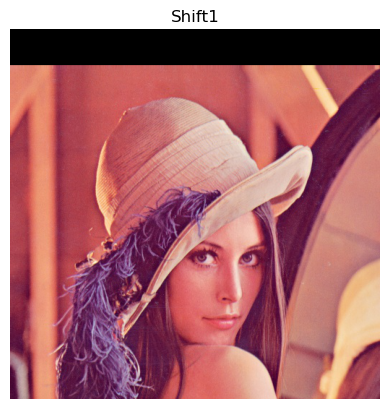

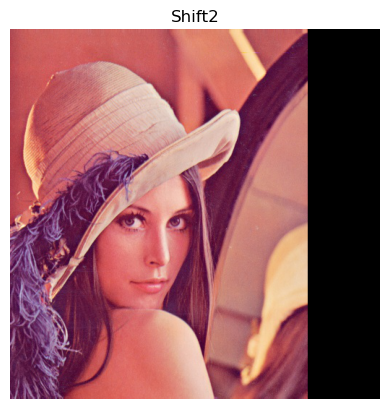

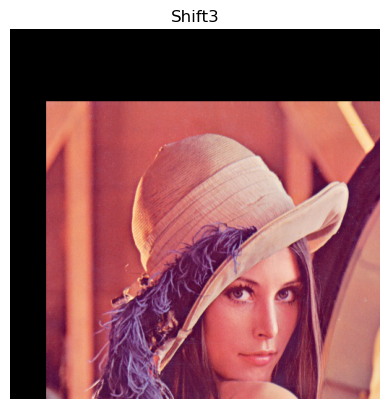

In [29]:
import numpy as np
import cv2
# Define the translate function.
def translate(img, x, y):
 # Obtain the image size.
 (h, w) = img.shape[:2]

 # Define the translation matrix.
 M = np.float32([[1, 0, x], [0, 1, y]])

 # Use the OpenCV affine transformation function to implement the translation operation.
 shifted = cv2.warpAffine(img, M, (w, h))
 # Return the shifted image.
 return shifted
# Load and display the image.
im = cv2.imread('lena.jpg')
matshow("Orig", im)
# Translate the original image.
# 50 pixels down.
shifted = translate(im, 0, 50)
matshow("Shift1", shifted)
# 100 pixels left.
shifted = translate(im, -100, 0)
matshow("Shift2", shifted)
# 50 pixels right and 100 pixels down.
shifted = translate(im, 50, 100)
matshow("Shift3", shifted)


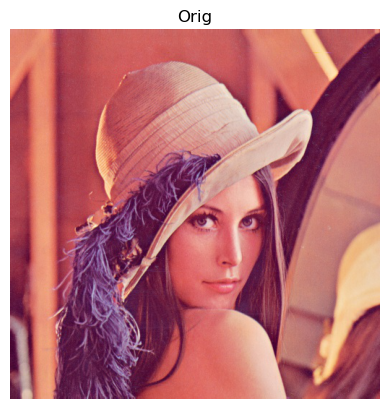

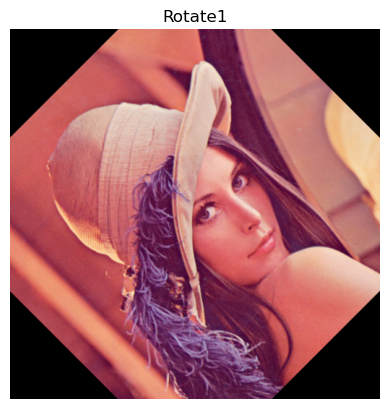

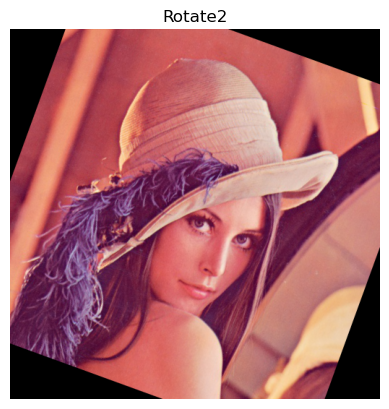

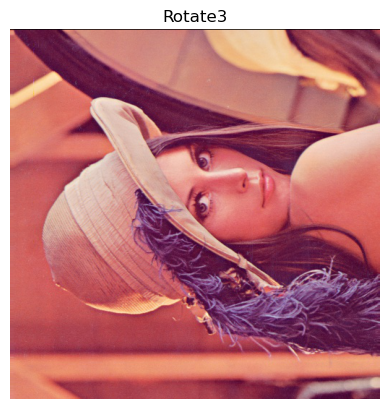

In [31]:
import numpy as np
import cv2
# Define the rotate function.
def rotate(img, angle, center=None, scale=1.0):
 # Obtain the image size.
 (h, w) = img.shape[:2]
 # The missing value of the rotation center is the image center.
 if center is None:
     center = (w / 2, h / 2)
 # Invoke the function of calculating the rotation matrix.
 M = cv2.getRotationMatrix2D(center, angle, scale)

 # Use the OpenCV affine transformation function to implement the rotation operation.
 rotated = cv2.warpAffine(img, M, (w, h))
 # Return the rotated image.
 return rotated
im = cv2.imread('lena.jpg')
matshow("Orig", im)
# Rotate the original image.
# 45 degrees counterclockwise.
rotated = rotate(im, 45)
matshow("Rotate1", rotated)
# 20 degrees clockwise.
rotated = rotate(im, -20)
matshow("Rotate2", rotated)
# 90 degrees counterclockwise.
rotated = rotate(im, 90)
matshow("Rotate3", rotated)

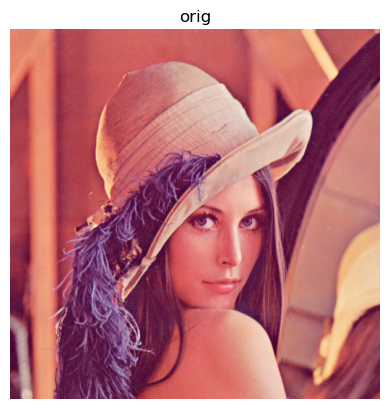

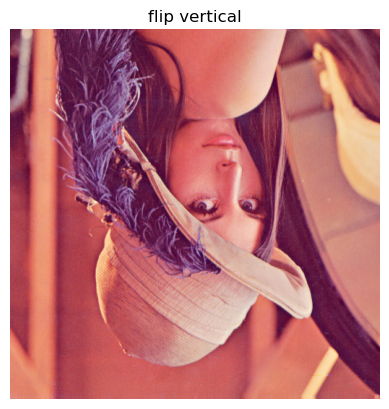

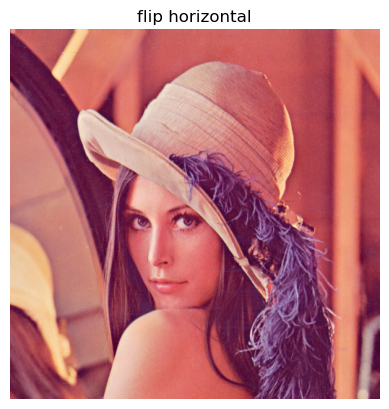

In [35]:
import cv2
im = cv2.imread('lena.jpg')
matshow("orig", im)
# Perform vertical mirroring.
im_flip0 = cv2.flip(im, 0)
matshow("flip vertical", im_flip0)
im_flip1 = cv2.flip(im, 1)
# Perform horizontal mirroring.
matshow("flip horizontal", im_flip1)

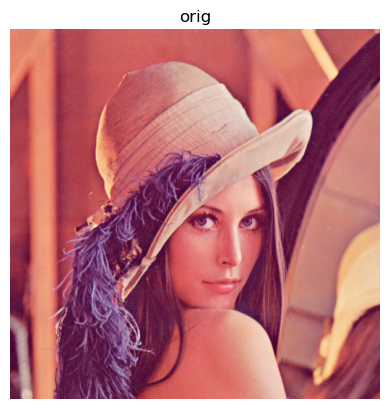

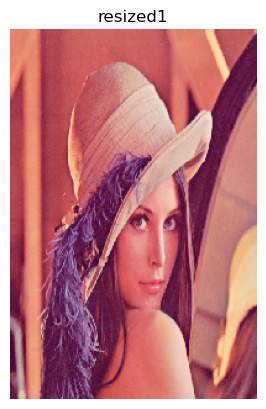

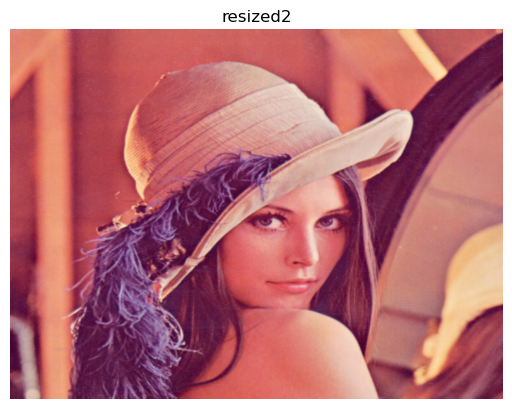

In [37]:
import numpy as np
import cv2
im = cv2.imread('lena.jpg')
matshow("orig", im)
# Obtain the image size.
(h, w) = im.shape[:2]
# Target size for scaling.
dst_size = (200, 300)
# Nearest interpolation
method = cv2.INTER_NEAREST
# Perform scaling.
resized = cv2.resize(im, dst_size, interpolation = method)
matshow("resized1", resized)
# Target size for scaling.
dst_size = (800, 600)
# Bilinear interpolation
method = cv2.INTER_LINEAR
# Perform scaling.
resized = cv2.resize(im, dst_size, interpolation = method)
matshow("resized2", resized)

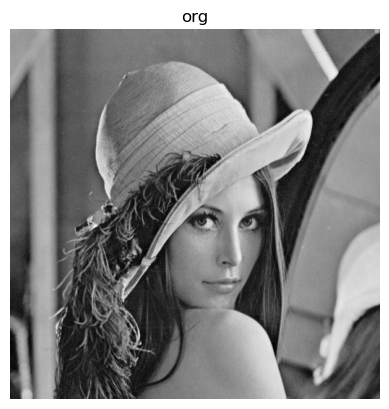

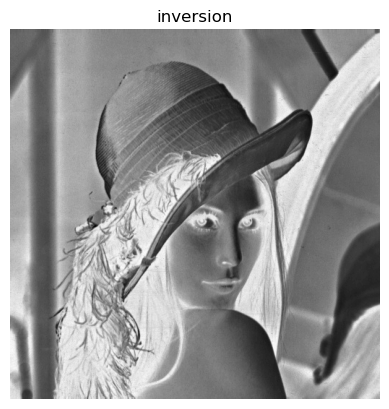

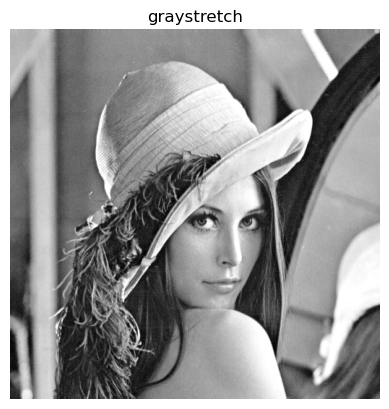

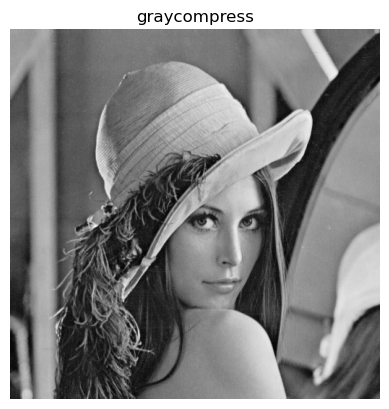

In [39]:
# Define the linear grayscale transformation function.
# k > 1: Stretch the grayscale value.
# 0 < k < 1: Compress the grayscale value.
# k = -1, b = 255: Perform grayscale inversion.
def linear_trans(img, k, b=0):
 # Calculate the mapping table of linear grayscale changes.
 trans_list = [(np.float32(x)*k+b) for x in range(256)]
 # Convert the list to np.array.
 trans_table =np.array(trans_list)
 # Adjust the value out of the range [0,255] and set the data type to uint8.
 trans_table[trans_table>255] = 255
 trans_table[trans_table<0] = 0
 trans_table = np.round(trans_table).astype(np.uint8)
 # Use the look up table function in the OpenCV to change the image grayscale value.
 return cv2.LUT(img, trans_table)
im = cv2.imread('lena.jpg',0)
matshow('org', im)
# Inversion.
im_inversion = linear_trans(im, -1, 255)
matshow('inversion', im_inversion)
# Grayscale stretch.
im_stretch = linear_trans(im, 1.2)
matshow('graystretch', im_stretch)
# Grayscale compression.
im_compress = linear_trans(im, 0.8)
matshow('graycompress', im_compress)

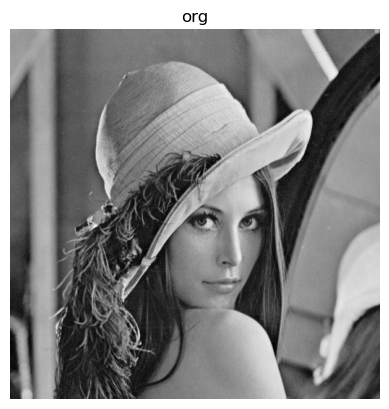

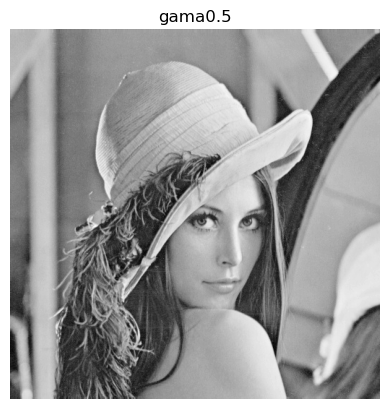

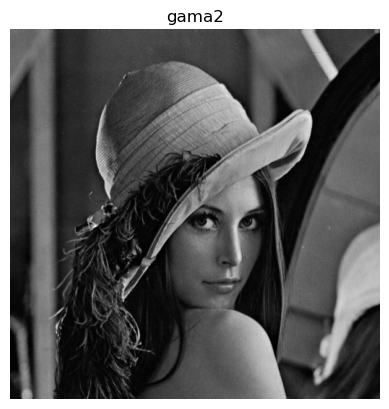

In [43]:
# Define the gamma transformation function.
def gamma_trans(img, gamma):
 # Firstly normalize the input to [0,1], perform the gamma function, and then restore the input to [0,255].
 gamma_list = [np.power(x / 255.0, gamma) * 255.0 for x in range(256)]
 # Convert list to np.array and set the data type to uint8.
 gamma_table = np.round(np.array(gamma_list)).astype(np.uint8)
 # Use the look up table function of the OpenCV to change the image grayscale value.
 return cv2.LUT(img, gamma_table)
im = cv2.imread('lena.jpg',0)
matshow('org', im)
# Use the gamma value 0.5 to stretch the shadow and compress the highlight.
im_gama05 = gamma_trans(im, 0.5)
matshow('gama0.5', im_gama05)
# Use the gamma value 2 to stretch the highlight and compress the shadow.
im_gama2 = gamma_trans(im, 2)
matshow('gama2', im_gama2)

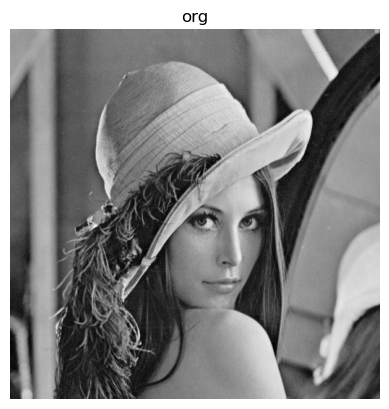

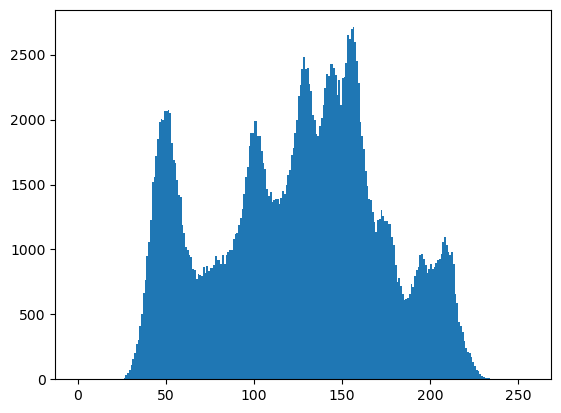

In [45]:
from matplotlib import pyplot as plt
# Read and display the image.
im = cv2.imread("lena.jpg",0)
matshow('org', im)
# Draw a histogram for the grayscale image.
plt.hist(im.ravel(), 256, [0,256])
plt.show()

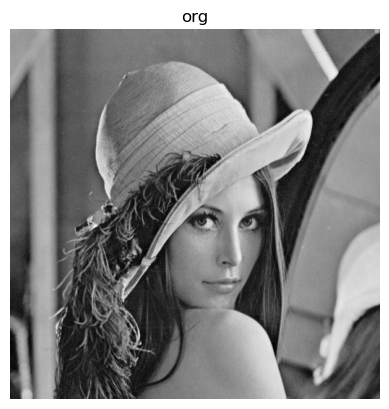

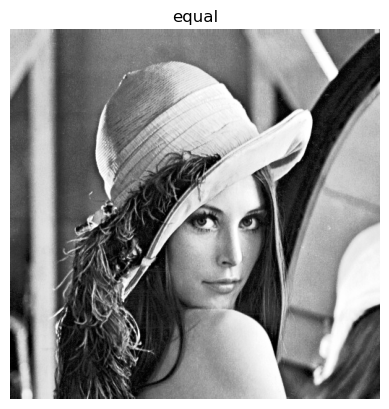

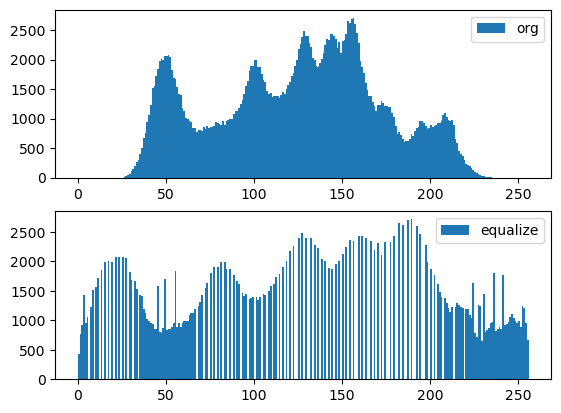

In [47]:
im = cv2.imread("lena.jpg",0)
matshow('org', im)
# Invoke the histogram equalization API of the OpenCV.
im_equ1 = cv2.equalizeHist(im)
matshow('equal', im_equ1)
# Display the histogram of the original image.
plt.subplot(2,1,1)
plt.hist(im.ravel(), 256, [0,256],label='org')
plt.legend()
# Display the histogram of the equalized image.
plt.subplot(2,1,2)
plt.hist(im_equ1.ravel(), 256, [0,256],label='equalize')
plt.legend()
plt.show()

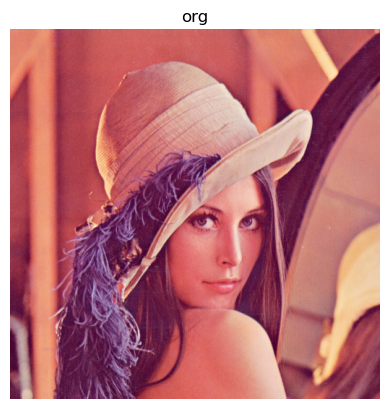

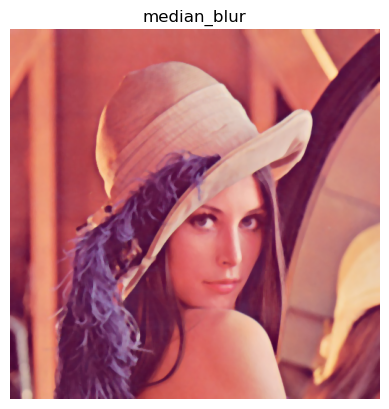

In [49]:
import cv2
import numpy as np
im = cv2.imread('lena.jpg')
matshow('org', im)
# Invoke the median fuzzy API of OpenCV.
im_medianblur = cv2.medianBlur(im, 5)

matshow('median_blur', im_medianblur)

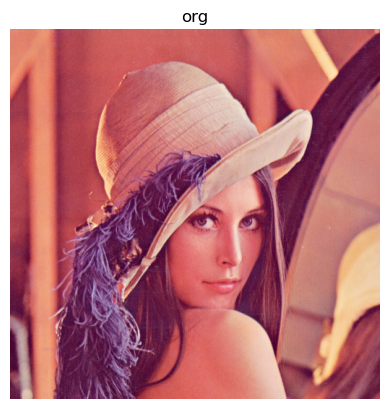

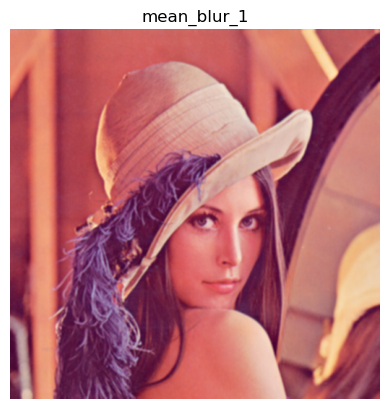

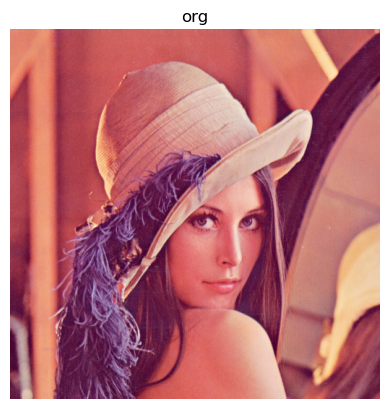

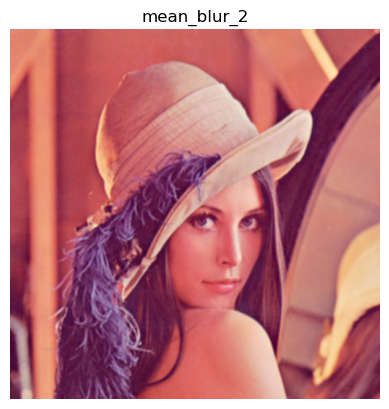

In [51]:
# Method 1: Invoke the OpenCV API directly.
import cv2
import numpy as np
im = cv2.imread('lena.jpg')
matshow('org', im)
# Invoke the API for fuzzy average value of OpenCV.
im_meanblur1 = cv2.blur(im, (3, 3))
matshow('mean_blur_1', im_meanblur1)
# Method 2: Use mean operator and filter2D to customize filtering.
import cv2
import numpy as np
im = cv2.imread('lena.jpg')
matshow('org', im)
# mean operator
mean_blur = np.ones([3, 3], np.float32)/9
# Use filter2D to perform filtering.
im_meanblur2 = cv2.filter2D(im, -1, mean_blur)
matshow('mean_blur_2', im_meanblur2)

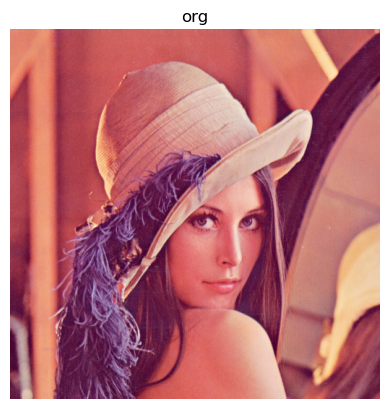

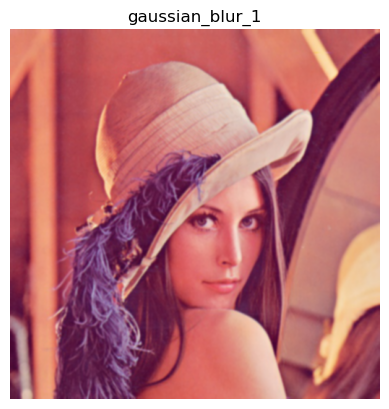

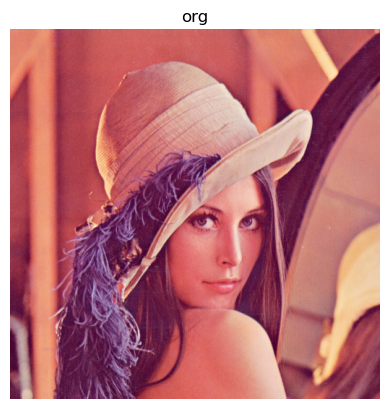

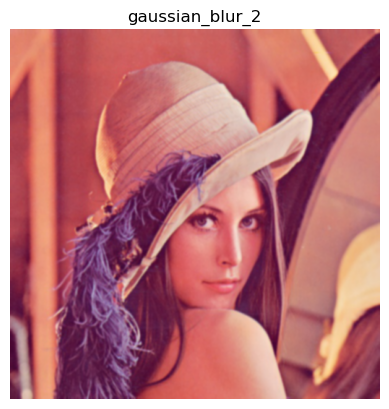

In [53]:
import cv2
import numpy as np
im = cv2.imread('lena.jpg')
matshow('org',im)
# Invoke the Gaussian filtering API of the OpenCV.
im_gaussianblur1 = cv2.GaussianBlur(im, (5, 5), 0)
matshow('gaussian_blur_1',im_gaussianblur1)
# Method 2: Use the Gaussian operator and filter2D to customize filtering operations.
import cv2
import numpy as np
im = cv2.imread('lena.jpg')
matshow('org',im)
# Gaussian operator
gaussian_blur = np.array([
 [1,4,7,4,1],
 [4,16,26,16,4],
 [7,26,41,26,7],
 [4,16,26,16,4],
 [1,4,7,4,1]], np.float32)/273
# # Use filter2D to perform filtering.
im_gaussianblur2 = cv2.filter2D(im,-1,gaussian_blur)
matshow('gaussian_blur_2',im_gaussianblur2)

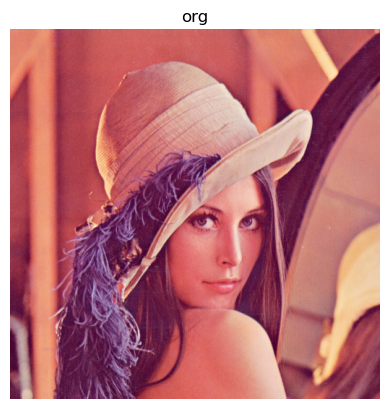

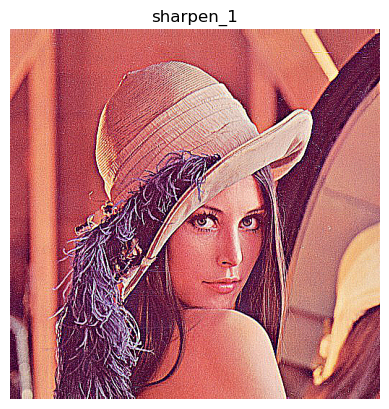

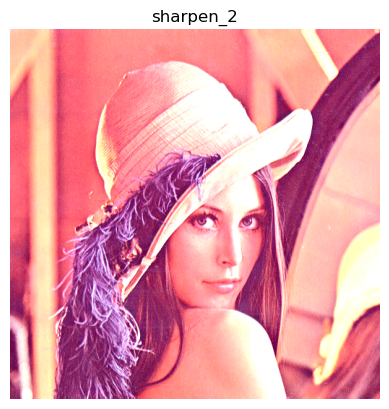

In [55]:
im = cv2.imread('lena.jpg')
matshow('org',im)
# Sharpening operator 1.
sharpen_1 = np.array([
 [-1,-1,-1],
 [-1,9,-1],
 [-1,-1,-1]])
# Use filter2D to perform filtering.
im_sharpen1 = cv2.filter2D(im,-1,sharpen_1)
matshow('sharpen_1',im_sharpen1)
# Sharpening operator 2.
sharpen_2 = np.array([
 [0,-1,0],
 [-1,8,-1],
 [0,1,0]])/4.0
# Use filter2D to perform filtering.
im_sharpen2 = cv2.filter2D(im,-1,sharpen_2)
matshow('sharpen_2',im_sharpen2)